In [170]:
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score,davies_bouldin_score
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
import string
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from bertopic import BERTopic
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import plotly.graph_objects as go
import re
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from collections import Counter
from kneed import KneeLocator
from sklearn.cluster import AgglomerativeClustering
from sklearn.manifold import TSNE

In [171]:
# Initialize NLTK components
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('vader_lexicon')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\atani\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\atani\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\atani\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [172]:
# Define custom stopwords
custom_stopwords = set(stopwords.words('english')).union({
    'car', 'cars',  'combined', 'hyundai', 'kona', 'stellantis', 'market', 'available', 'jeep', 'tesla', 'niro', 'mokka', 'vauxhall',  'cooper',
    'would', 'also', 'new', 'level', 'like', 'even', 'according', 'offered', 'move',
    'one', 'content', 'information', 'interests', 'activity', 'mean', 'go', 'quit',
    'got', 'much', 'actual', 'thing', 'bit', 'see', 'think', 'yeah', 'know', 'and', 
    'way', 'come', 'presented', 'example', 'esposito', 'lee', 'torque', 'ready', 
    'since', 'still', 'two', 'sold', 'week', 'sherpa', 'around', 'use', 'um', 
    'together', 'us', 'really', 'america', 'well', 'mirafiori', 'campaign', 'north',
    'sales', 'bag', 'says', 'get', 'world', 'germani', 'belgium', 'spain',
    'uh', 'oh', 'im', 'thats', 'youre', 'weve', 'dont', 'actually', 'ahmed', 'work', 'reuters','youve','there','going',
    'gelateria', 'list', 'required', 'instead', 'added', 'inbox', 'honda', 'help', 'dedicated',
    'inform', 'news', 'group', 'report', 'couldnt', 'three', 'including', 'however', 'people', 'review', 'avenger','wave','bmw',
    'want','cant','though','chinese'
})
custom_stopwords = list(custom_stopwords)  # Convert the set to a list

# Function to preprocess the text
def preprocess(text):
    if pd.isna(text):
        return ''  # Handle NaN values
    text = text.lower()  # Convert to lowercase
    text = text.translate(str.maketrans('', '', string.punctuation))  # Remove punctuation
    tokens = word_tokenize(text)  # Tokenize
    tokens = [word for word in tokens if word not in custom_stopwords and word.isalpha()]  # Remove stopwords
    return ' '.join(tokens)

In [173]:
# Function to find the optimal number of clusters using multiple methods
def find_optimal_clusters(X, max_k=8):
    inertia = []
    silhouette = []
    davies_bouldin = []

    # Elbow Method, Silhouette Score, and Davies-Bouldin Index
    for k in range(2, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        inertia.append(kmeans.inertia_)
        silhouette.append(silhouette_score(X, kmeans.labels_))
        davies_bouldin.append(davies_bouldin_score(X, kmeans.labels_))

    # Plot the results
    plt.figure(figsize=(16, 8))

    plt.subplot(1, 3, 1)
    plt.plot(range(2, max_k + 1), inertia, marker='o')
    plt.title('Elbow Method')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')

    plt.subplot(1, 3, 2)
    plt.plot(range(2, max_k + 1), silhouette, marker='o')
    plt.title('Silhouette Score')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')

    plt.subplot(1, 3, 3)
    plt.plot(range(2, max_k + 1), davies_bouldin, marker='o')
    plt.title('Davies-Bouldin Index')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Davies-Bouldin Index')

    plt.tight_layout()
    plt.show()

    # Determine the "elbow" point using the KneeLocator
    knee_locator = KneeLocator(range(2, max_k + 1), inertia, curve="convex", direction="decreasing")
    elbow_k = knee_locator.elbow
    
    # Determine the optimal number of clusters using a combined approach
    optimal_k = {
        'Elbow': elbow_k,
        'Silhouette': silhouette.index(max(silhouette)) + 2,
        'Davies-Bouldin': davies_bouldin.index(min(davies_bouldin)) + 2
    }

    print(f"Optimal k values determined by different methods: {optimal_k}")
    return optimal_k

In [174]:
# Function to plot the most common n-grams
def plot_ngrams(corpus, ngram_range=(1, 1), top_n=10, title="Top N-grams"):
    vec = CountVectorizer(ngram_range=ngram_range, stop_words=custom_stopwords).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)[:top_n]
    
    words, freqs = zip(*words_freq)
    plt.figure(figsize=(10, 5))
    sns.barplot(x=list(freqs), y=list(words))
    plt.title(title)
    plt.xlabel('Frequency')
    plt.ylabel('N-grams')
    plt.show()

# Function to visualize clusters using a scatter plot
def plot_clusters(X, labels, title="Cluster Plot"):
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette="viridis", s=100, alpha=0.7)
    plt.title(title)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.legend(title="Cluster")
    plt.show()


# Function to extract top keywords for each cluster
def extract_top_keywords(car_data, cluster_col='Cluster', n_keywords=10):
    top_keywords = {}
    for cluster in car_data[cluster_col].unique():
        cluster_data = car_data[car_data[cluster_col] == cluster]
        all_words = ' '.join(cluster_data['Processed_Text']).split()
        word_freq = Counter(all_words)
        top_keywords[cluster] = word_freq.most_common(n_keywords)
    return top_keywords

# Function to generate word clouds for each cluster
def generate_wordclouds(car_data, cluster_col='Cluster'):
    for cluster in car_data[cluster_col].unique():
        cluster_data = car_data[car_data[cluster_col] == cluster]
        all_words = ' '.join(cluster_data['Processed_Text'])
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words)
        
        # Plotting the word cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Word Cloud for Cluster {cluster}")
        plt.show()

# Function to analyze sentiment and subjectivity of cluster text
def analyze_cluster_text(car_data, cluster_col='Cluster'):
    analysis_results = {}
    for cluster in car_data[cluster_col].unique():
        cluster_data = car_data[car_data[cluster_col] == cluster]
        subjectivity_scores = cluster_data['Processed_Text'].apply(lambda x: TextBlob(x).sentiment.subjectivity)

        # Extract positive and negative keywords
        positive_keywords = []
        negative_keywords = []
        for text in cluster_data['Processed_Text']:
            blob = TextBlob(text)
            words = blob.words
            sentiment = blob.sentiment.polarity
            if sentiment > 0:
                positive_keywords.extend(words)
            elif sentiment < 0:
                negative_keywords.extend(words)

        analysis_results[cluster] = {
            'Average Subjectivity': np.mean(subjectivity_scores),
            'Positive Keywords': Counter(positive_keywords).most_common(10),
            'Negative Keywords': Counter(negative_keywords).most_common(10)
        }
    return analysis_results

# Integrate new features into the existing clustering function
def perform_clustering_and_analyze_text(data, car_name, max_k=8):
    car_data = data[data['Car'] == car_name]
    
    # Preprocess the text
    car_data['Processed_Text'] = car_data['Text'].apply(preprocess)
    
    # Check if there are any non-empty documents
    if car_data['Processed_Text'].str.strip().eq('').all():
        raise ValueError(f'No valid text data for {car_name}. All documents may be empty or contain only stop words.')
    
    # Plot n-grams
    plot_ngrams(car_data['Processed_Text'], ngram_range=(1, 1), top_n=10, title=f"Top 10 Unigrams for {car_name}")
    plot_ngrams(car_data['Processed_Text'], ngram_range=(2, 2), top_n=10, title=f"Top 10 Bigrams for {car_name}")
    plot_ngrams(car_data['Processed_Text'], ngram_range=(3, 3), top_n=10, title=f"Top 10 Trigrams for {car_name}")

    # Vectorize the text data using TF-IDF
    vectorizer = TfidfVectorizer(max_features=1000, ngram_range=(1, 2))  # Adjusted ngram_range
    X = vectorizer.fit_transform(car_data['Processed_Text'])
    
    # Check if the TF-IDF matrix is empty
    if X.shape[0] == 0:
        raise ValueError(f'Empty TF-IDF matrix for {car_name}. This might be due to empty or stopword-filtered documents.')

    # Dimensionality Reduction using PCA
    pca = PCA(n_components=0.85, random_state=42)  # Adjusted n_components
    X_reduced = pca.fit_transform(X.toarray())

    # Optional: Use t-SNE or UMAP for further reduction
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(X_reduced)
    
    # Find the optimal number of clusters using the updated method
    optimal_ks = find_optimal_clusters(X_tsne, max_k)
    selected_k = max(set(optimal_ks.values()), key=list(optimal_ks.values()).count)  # Majority vote

    print(f'Selected optimal number of clusters for {car_name}: {selected_k}')
    
    # Perform clustering with the selected number of clusters
    kmeans = KMeans(n_clusters=selected_k, random_state=42)
    car_data['Cluster'] = kmeans.fit_predict(X_tsne)
    
    # Plot clusters
    plot_clusters(X_tsne, car_data['Cluster'], title=f"Cluster Plot for {car_name}")

    # Generate word clouds for each cluster
    generate_wordclouds(car_data)
    
    # Extract top keywords for each cluster
    top_keywords = extract_top_keywords(car_data)
    
    # Analyze subjectivity and sentiment keywords
    text_analysis = analyze_cluster_text(car_data)
    
    # Get top comments and sentiment scores for each cluster
    top_comments = {}
    sentiment_scores = {}
    for cluster in range(selected_k):
        cluster_comments = car_data[car_data['Cluster'] == cluster]['Text'].tolist()
        top_comments[cluster] = cluster_comments[:15]  # Get top 15 comments
        
        
        # Initialize VADER sentiment analyzer
        sia = SentimentIntensityAnalyzer()
        # Calculate sentiment scores
        sentiment = [sia.polarity_scores(comment)['compound'] for comment in cluster_comments]
        avg_sentiment = sum(sentiment) / len(sentiment) if sentiment else 0
        sentiment_scores[cluster] = avg_sentiment
    
    return car_data, top_comments, sentiment_scores, top_keywords, text_analysis




In [175]:
# Load the dataset
competitors_data = pd.read_csv(r'C:\Users\atani\OneDrive - City, University of London\Tanisha\ARP\competitor_comments_combined_cleaned (1).csv')

# Ensure all values in the 'Text' column are strings and handle missing values
competitors_data['Text'] = competitors_data['Text'].astype(str).fillna('')

# List of car names in your dataset
car_names = competitors_data['Car'].unique()
# Filter out NaN car names
car_names = [name for name in car_names if pd.notna(name)]

Processing Jeep Avenger...


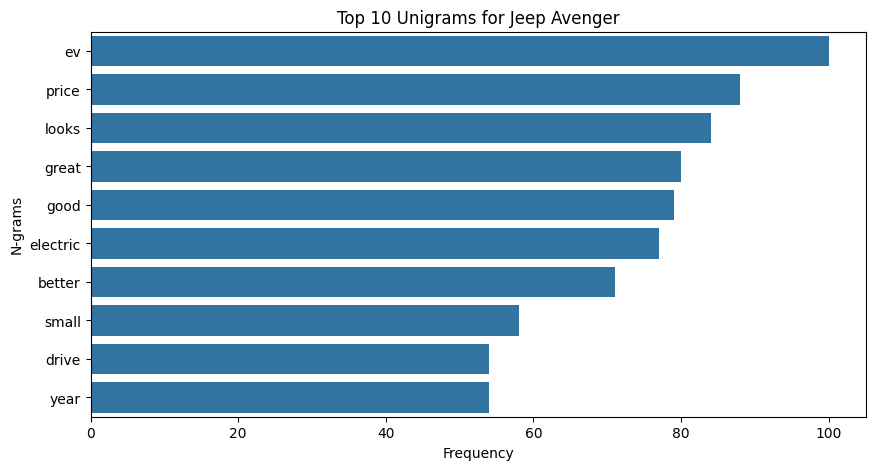

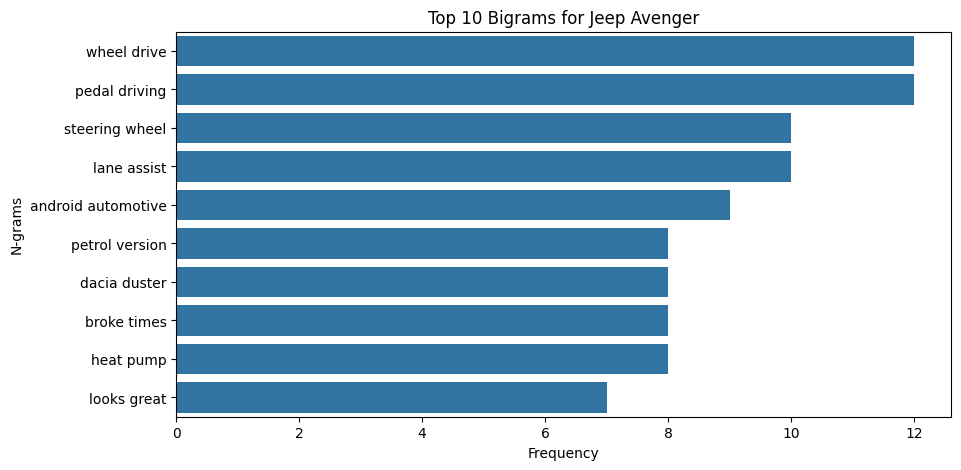

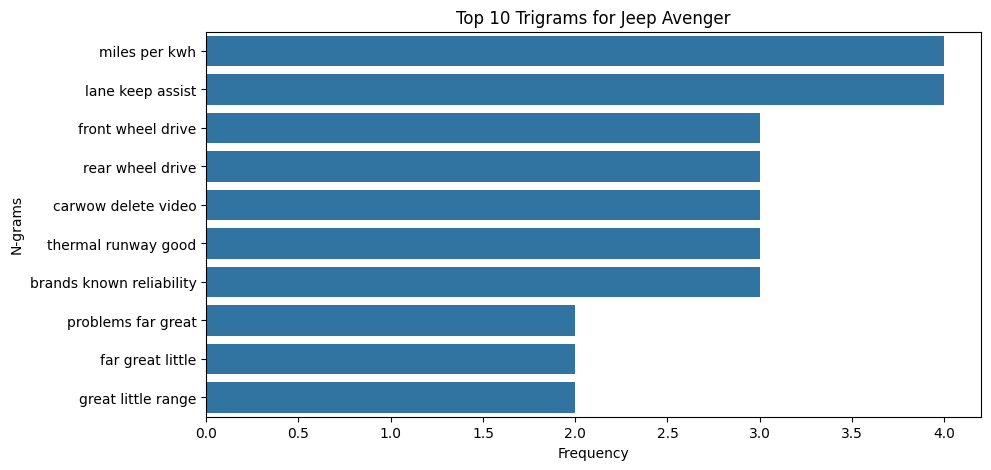

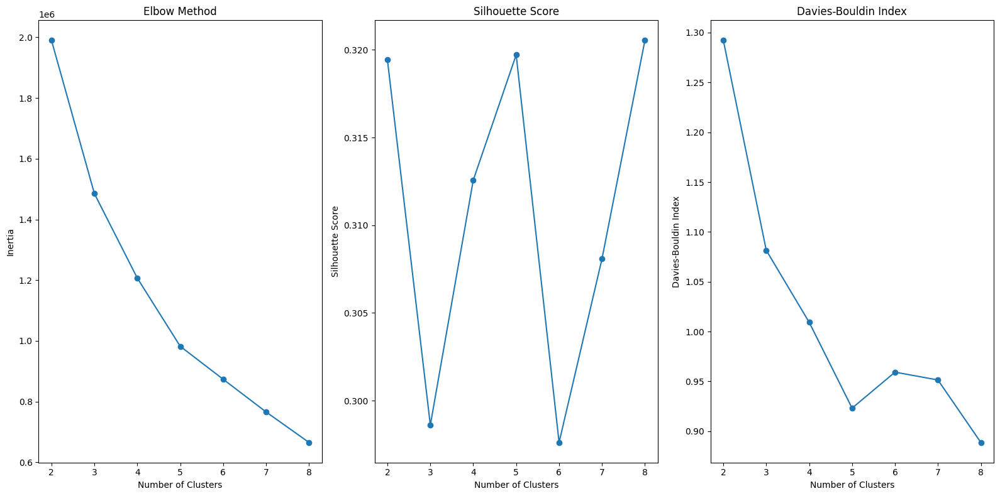

Optimal k values determined by different methods: {'Elbow': 5, 'Silhouette': 8, 'Davies-Bouldin': 8}
Selected optimal number of clusters for Jeep Avenger: 8


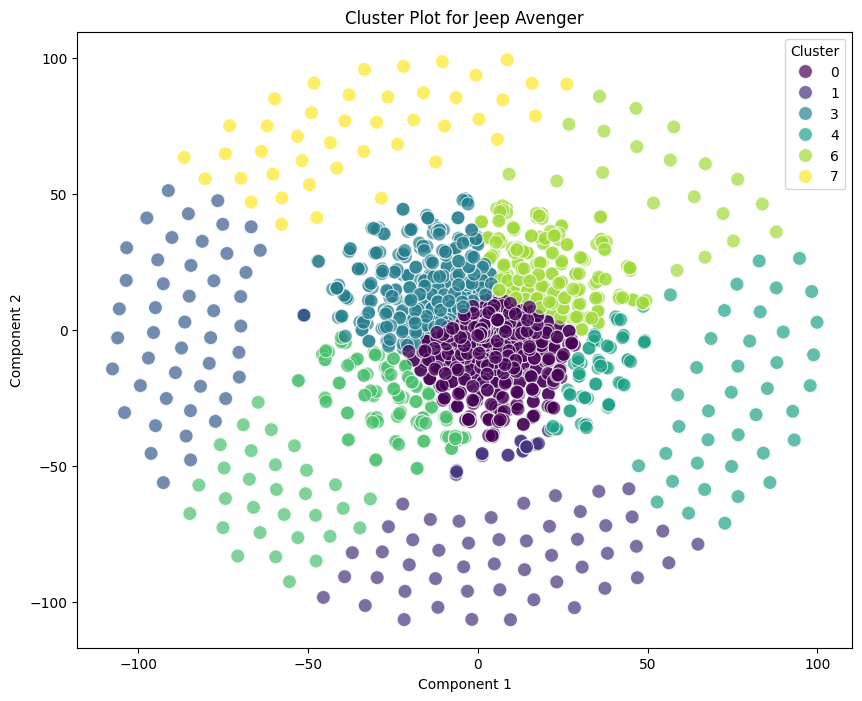

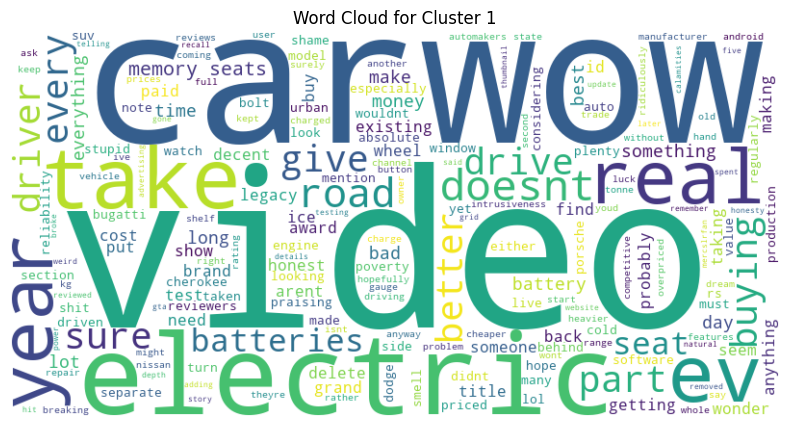

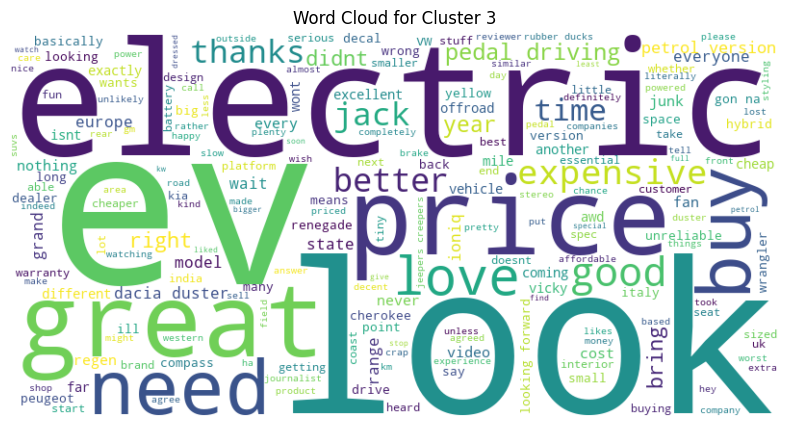

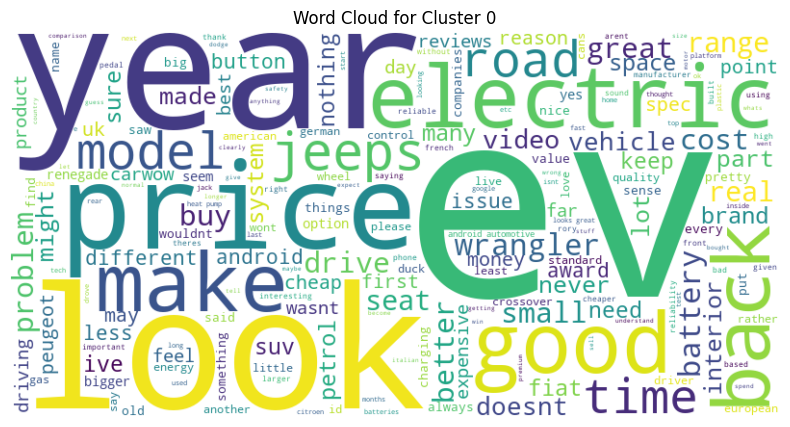

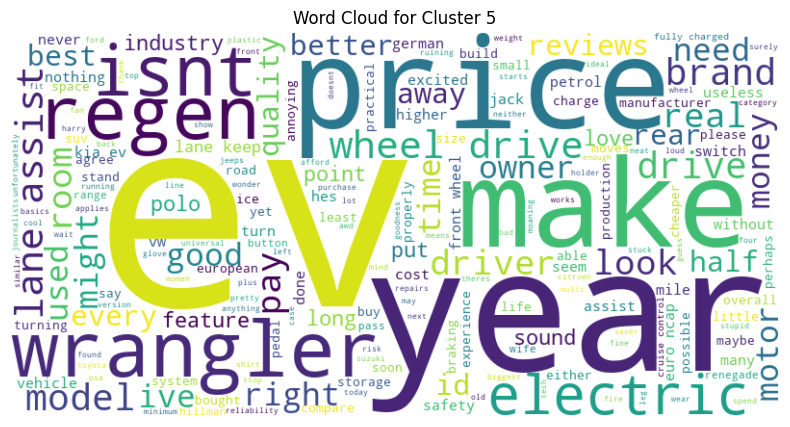

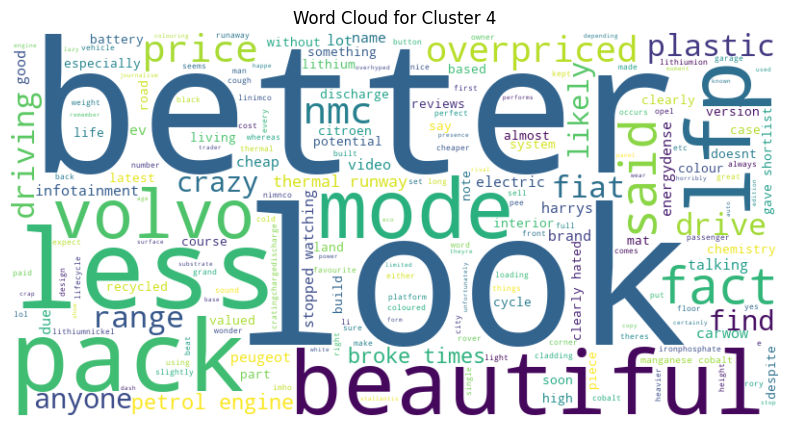

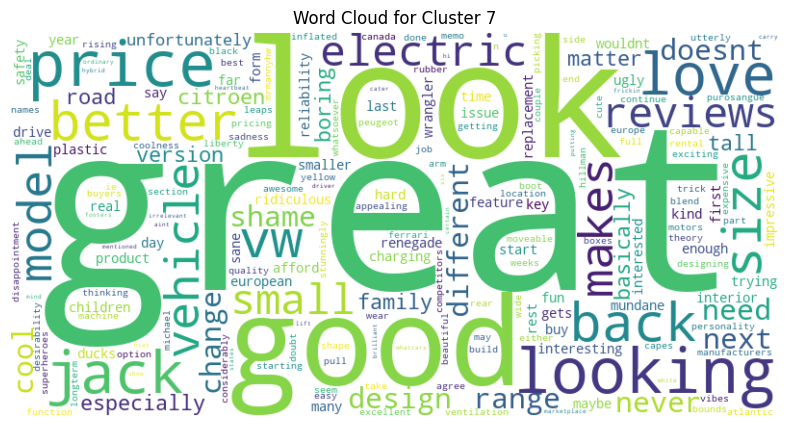

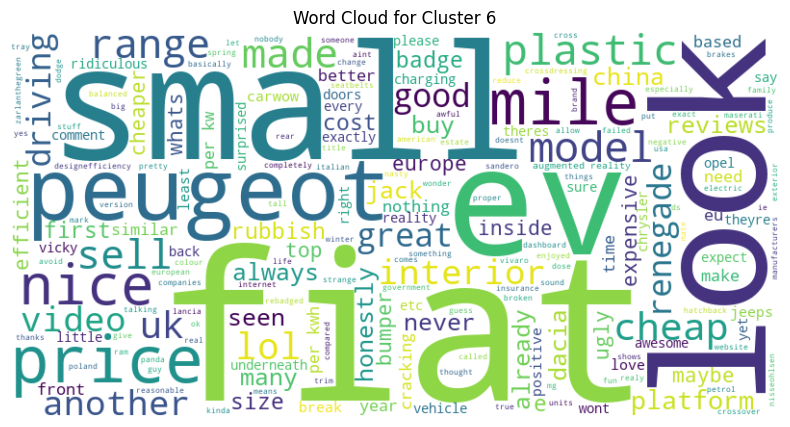

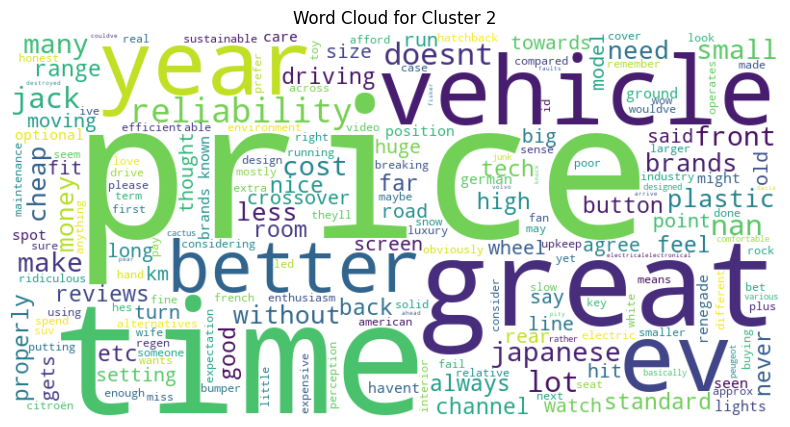

Processing Hyundai Kona...


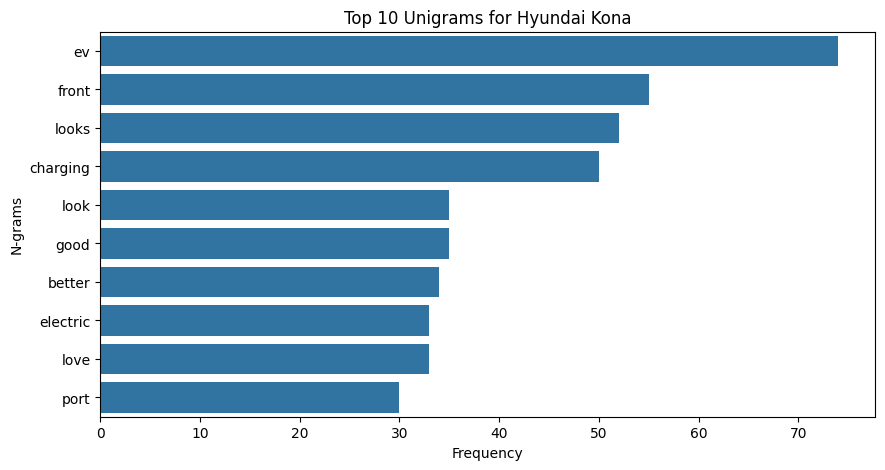

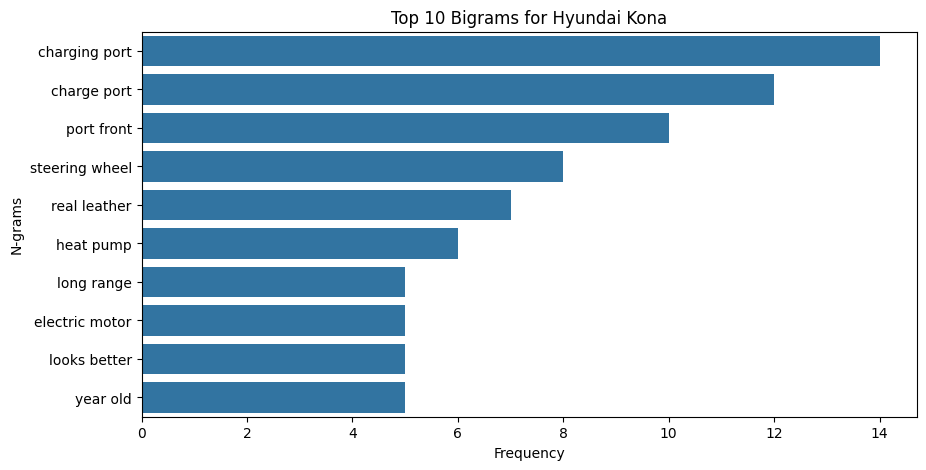

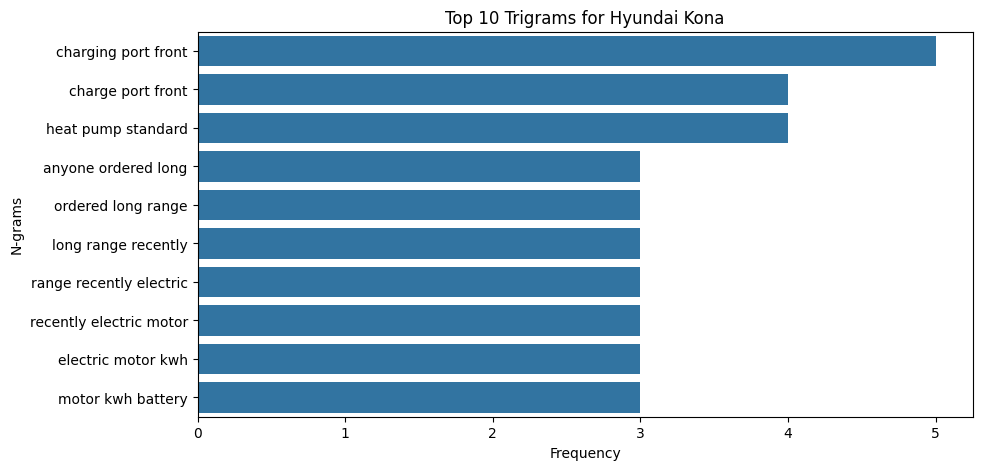

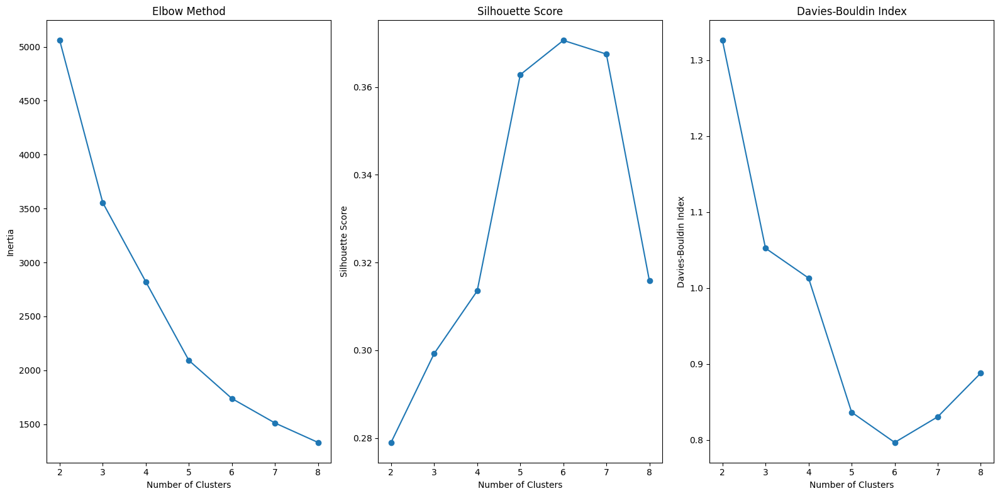

Optimal k values determined by different methods: {'Elbow': 5, 'Silhouette': 6, 'Davies-Bouldin': 6}
Selected optimal number of clusters for Hyundai Kona: 6


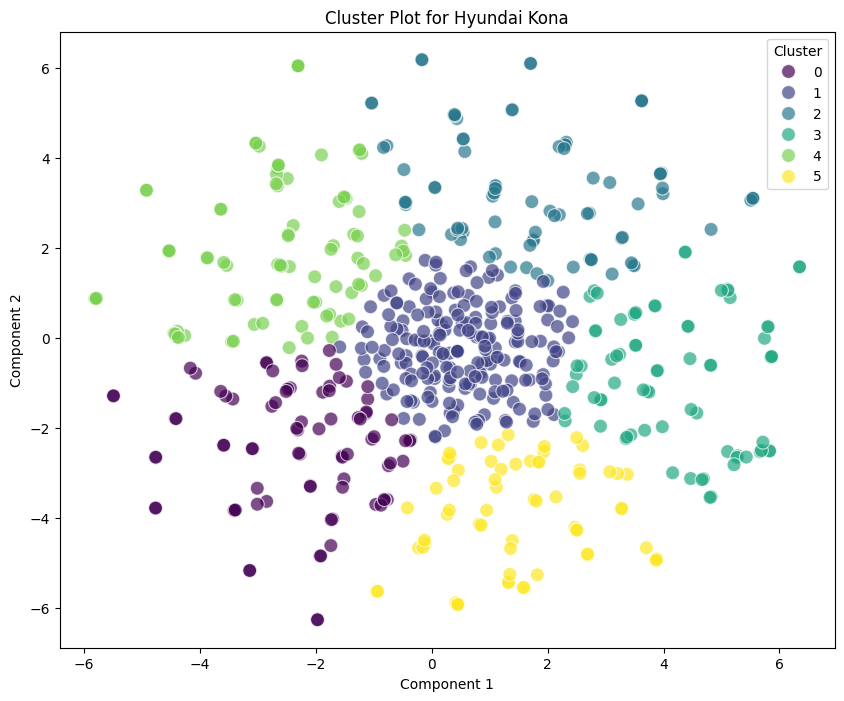

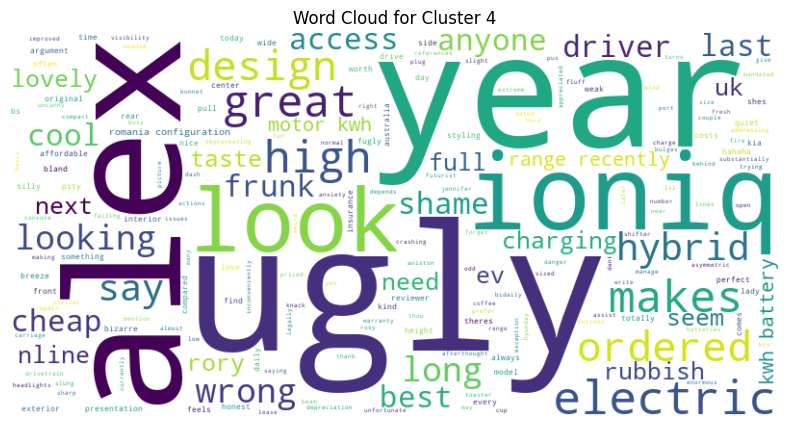

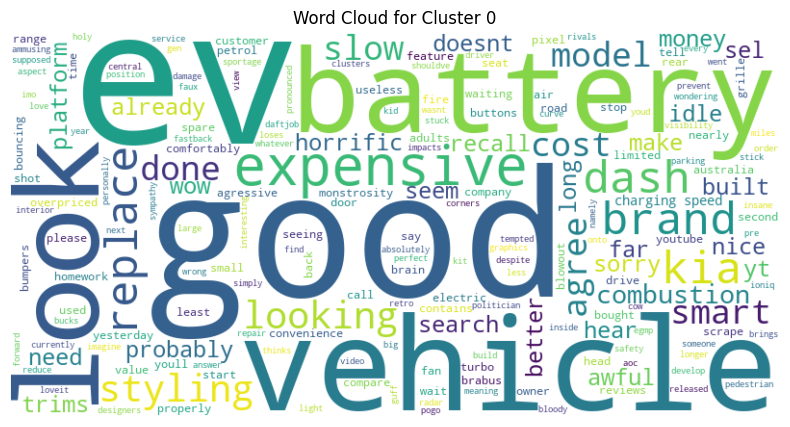

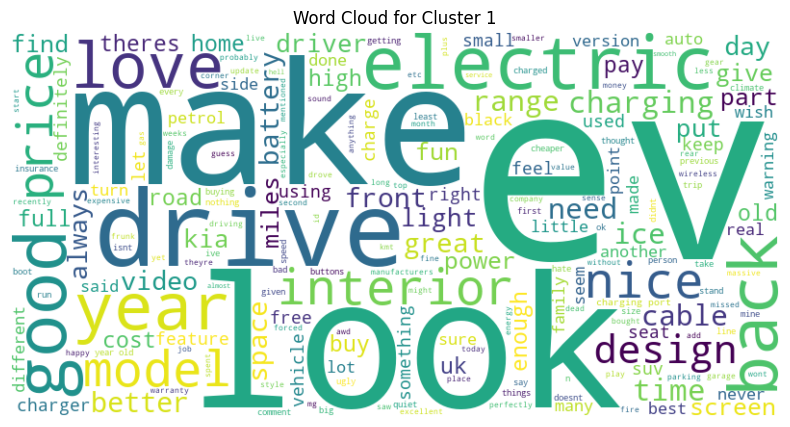

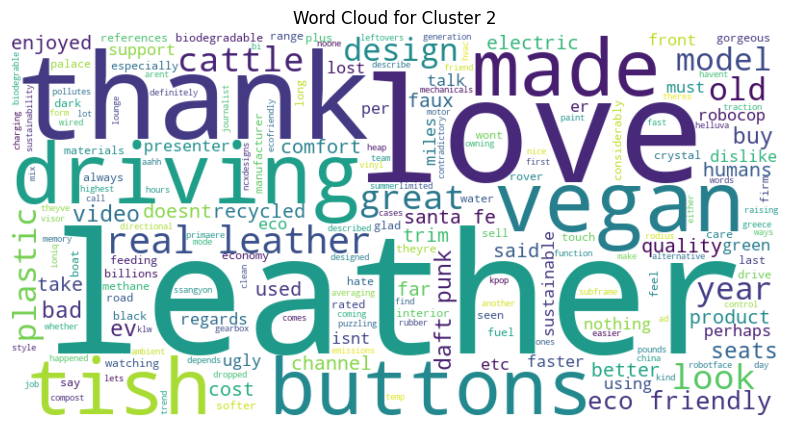

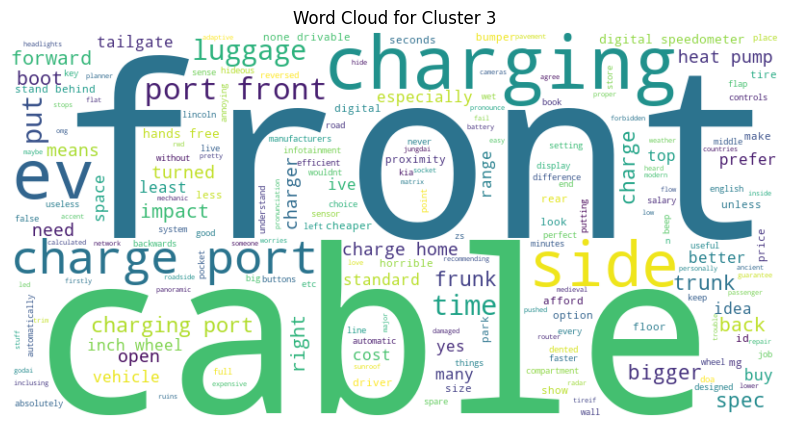

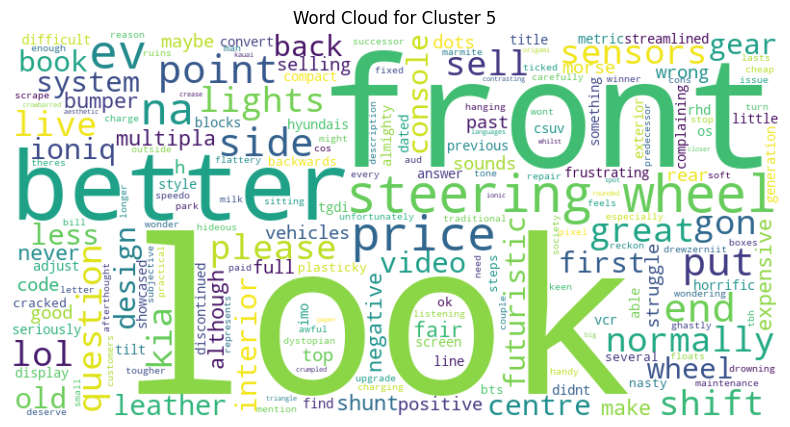

Processing Peugeot e2008...


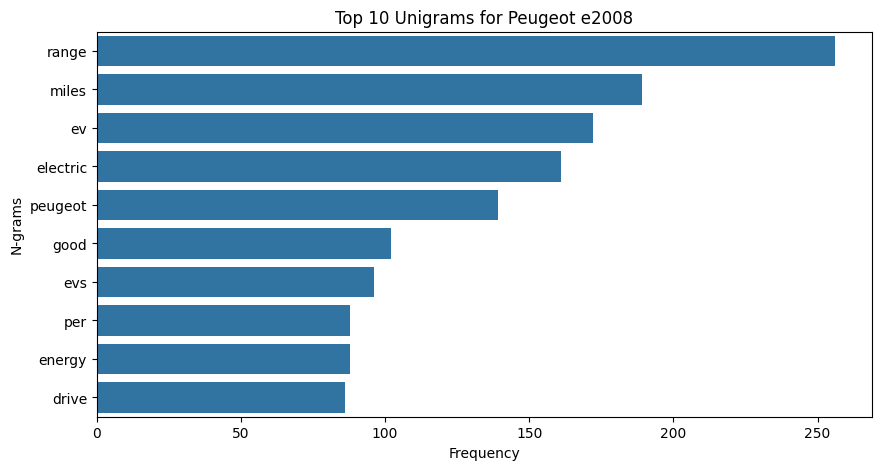

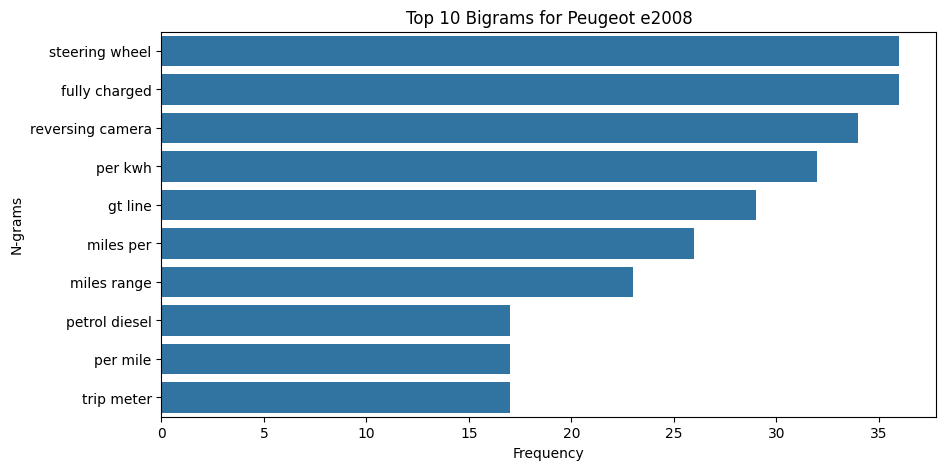

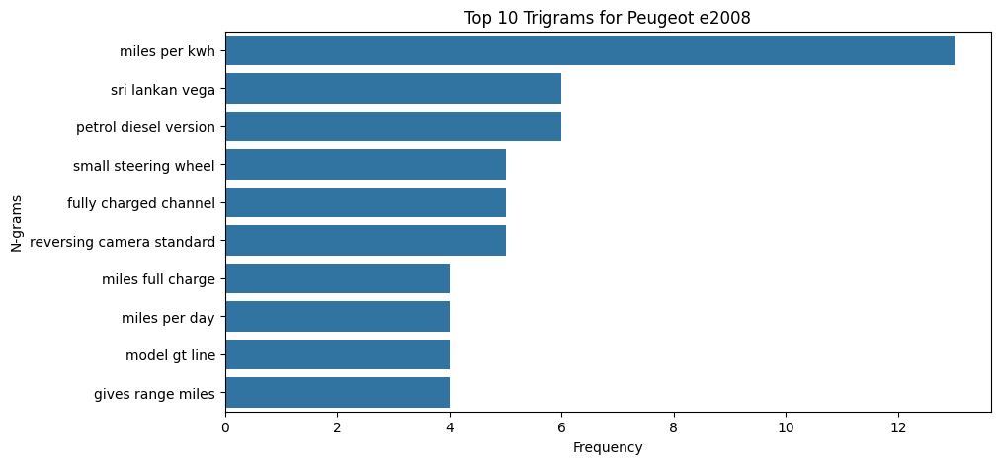

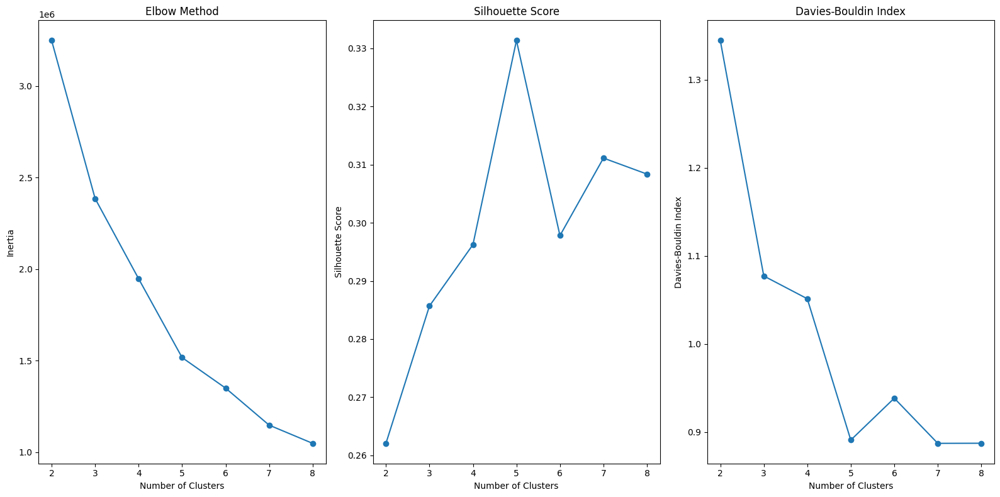

Optimal k values determined by different methods: {'Elbow': 5, 'Silhouette': 5, 'Davies-Bouldin': 7}
Selected optimal number of clusters for Peugeot e2008: 5


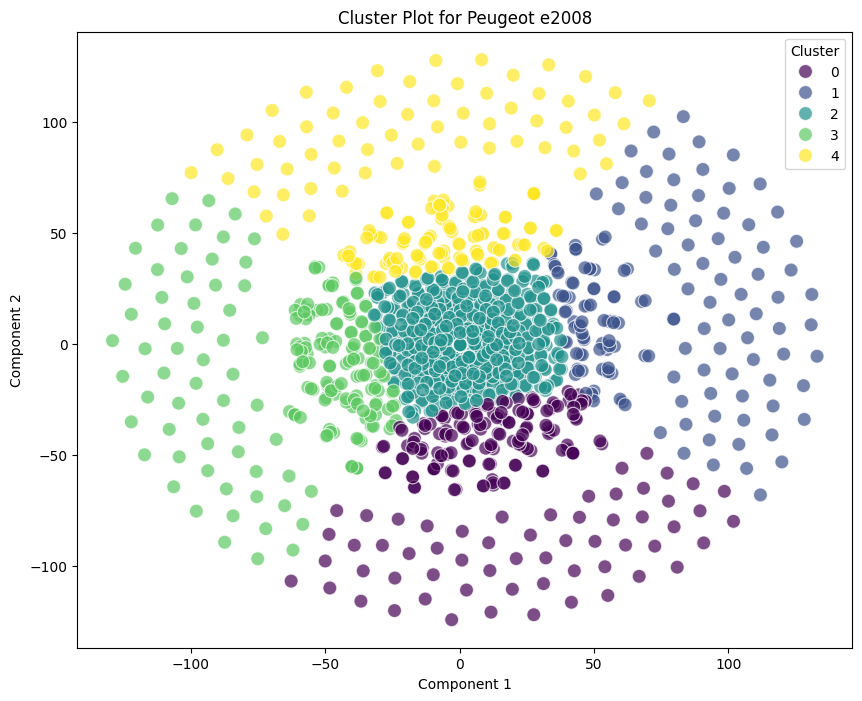

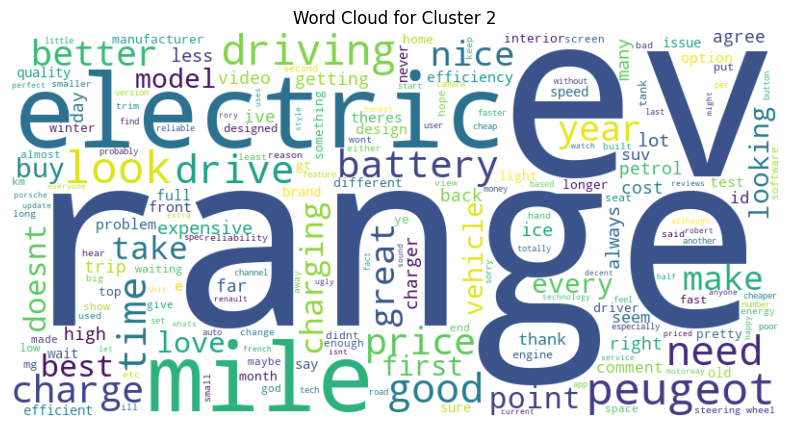

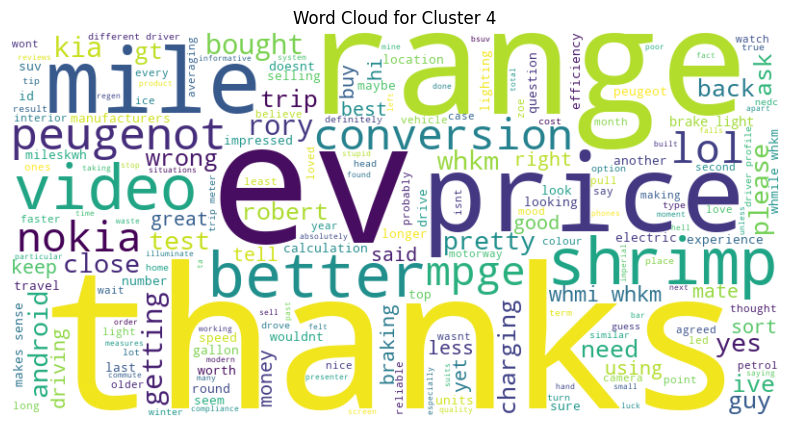

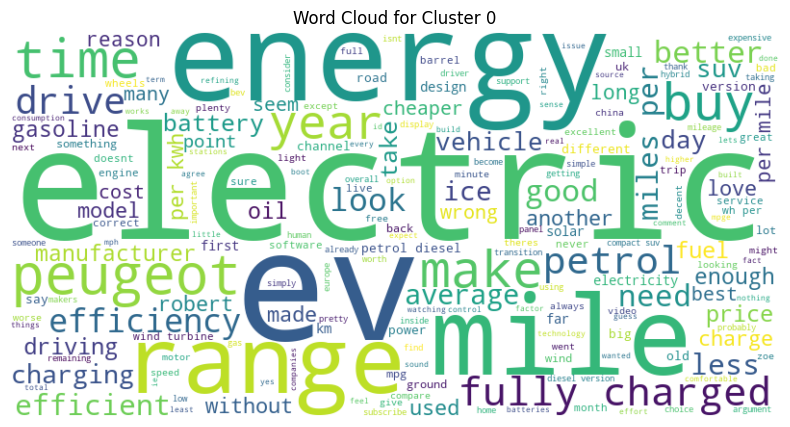

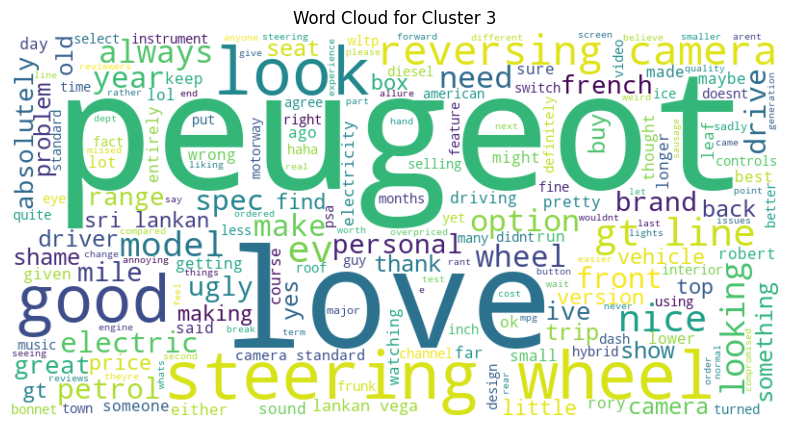

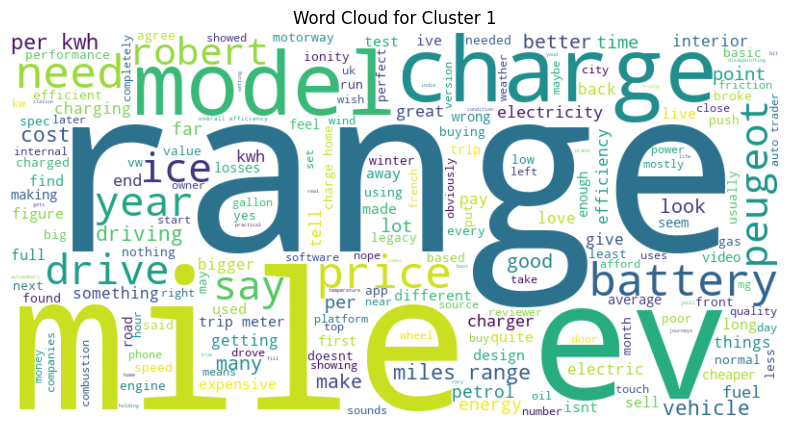

Processing Vauxhall Mokka...


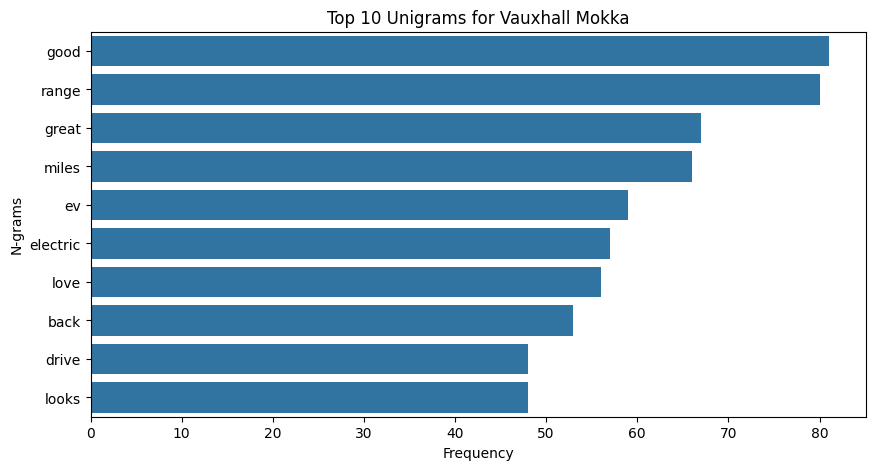

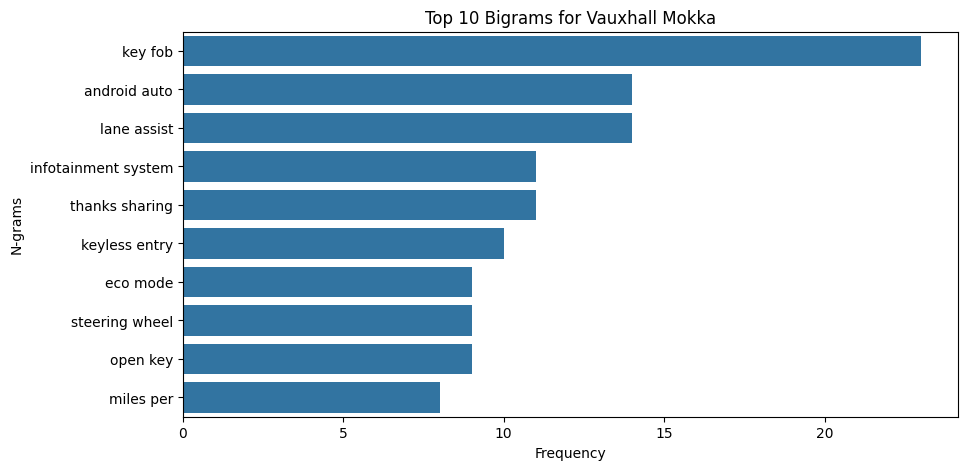

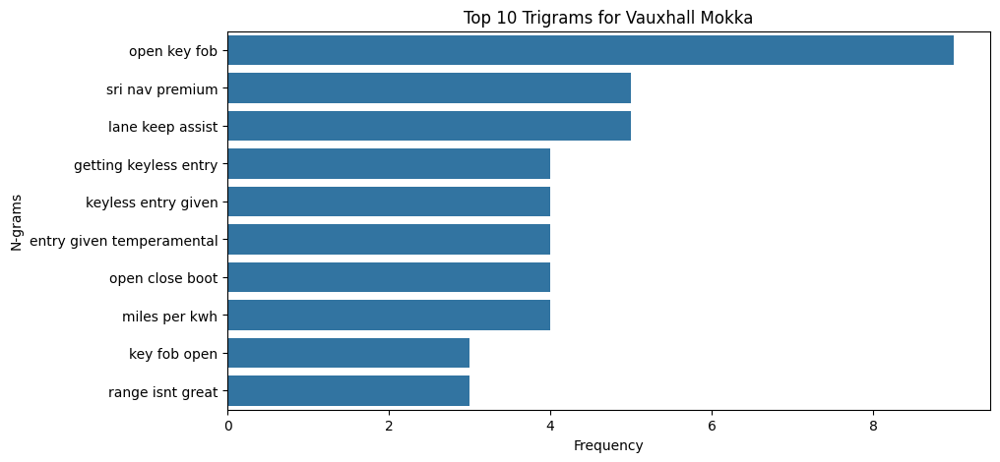

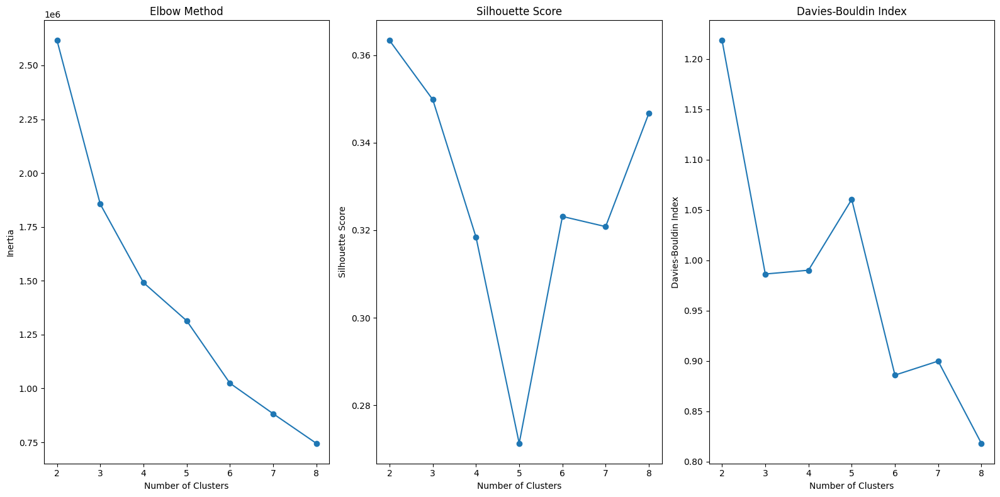

Optimal k values determined by different methods: {'Elbow': 4, 'Silhouette': 2, 'Davies-Bouldin': 8}
Selected optimal number of clusters for Vauxhall Mokka: 8


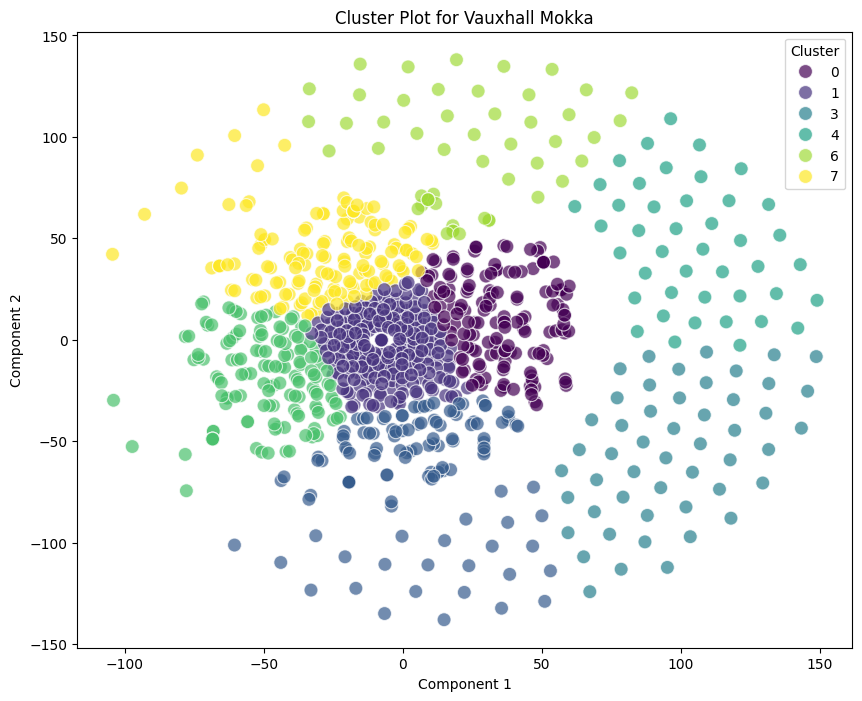

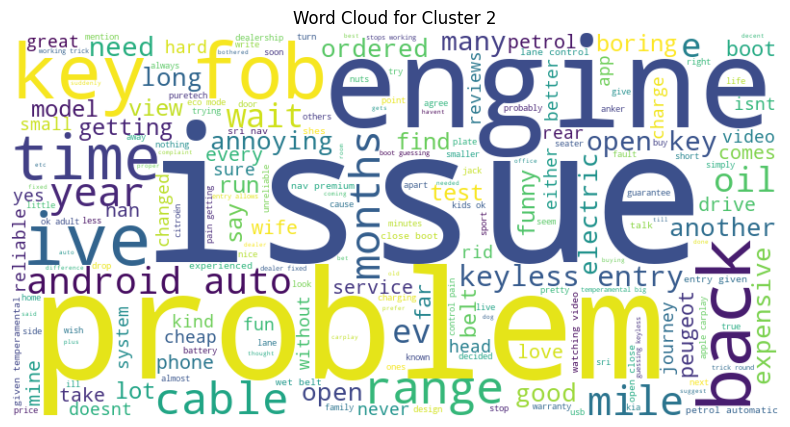

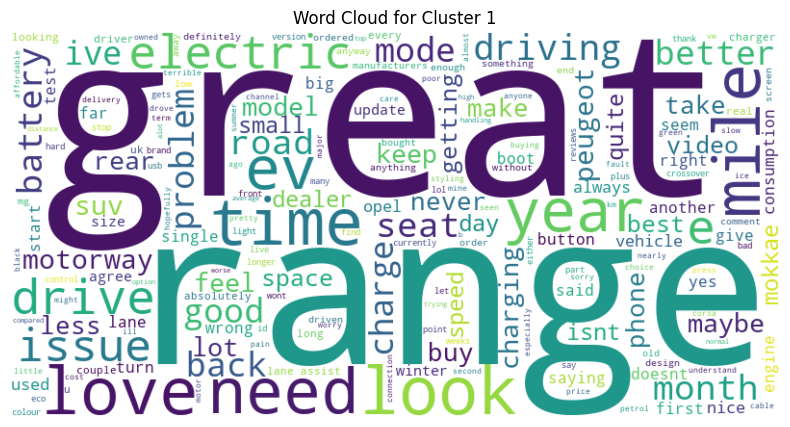

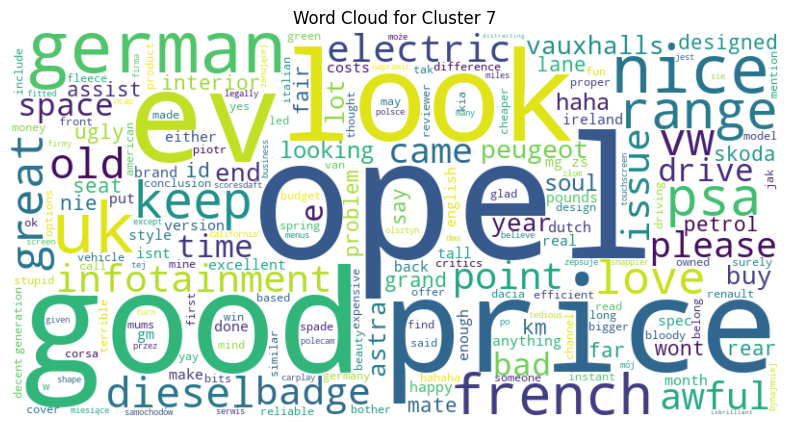

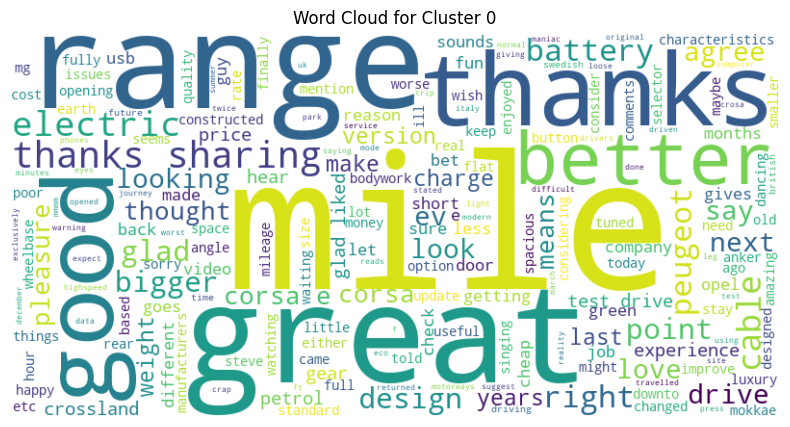

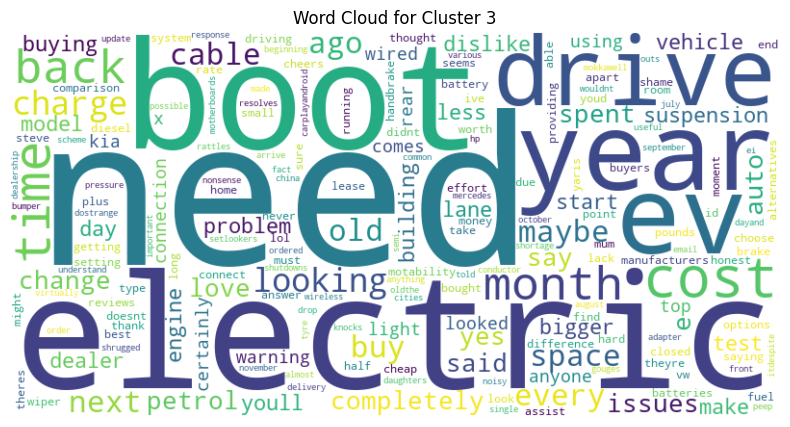

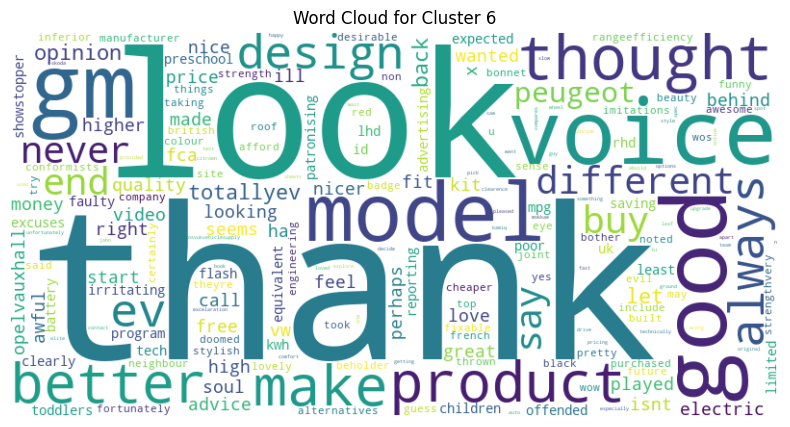

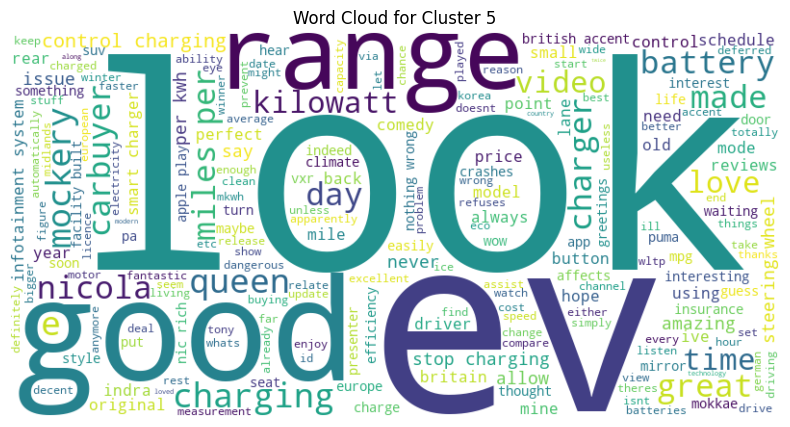

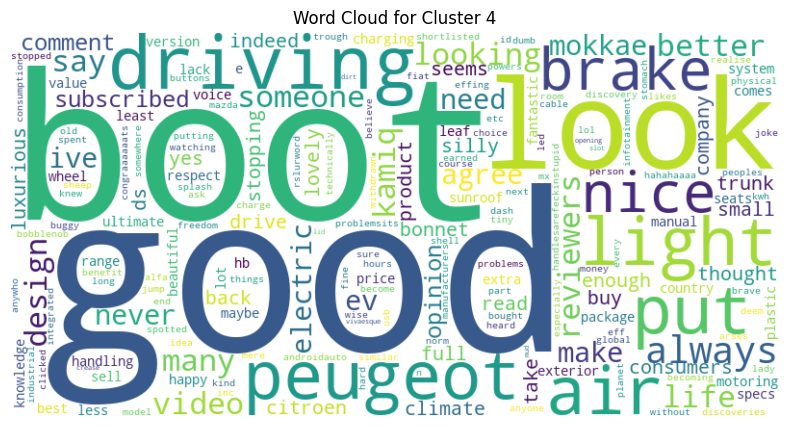

Processing Mini Cooper...


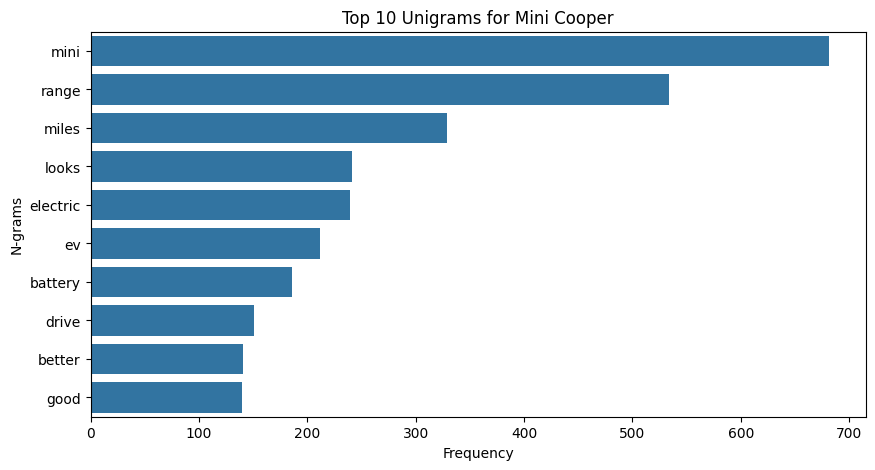

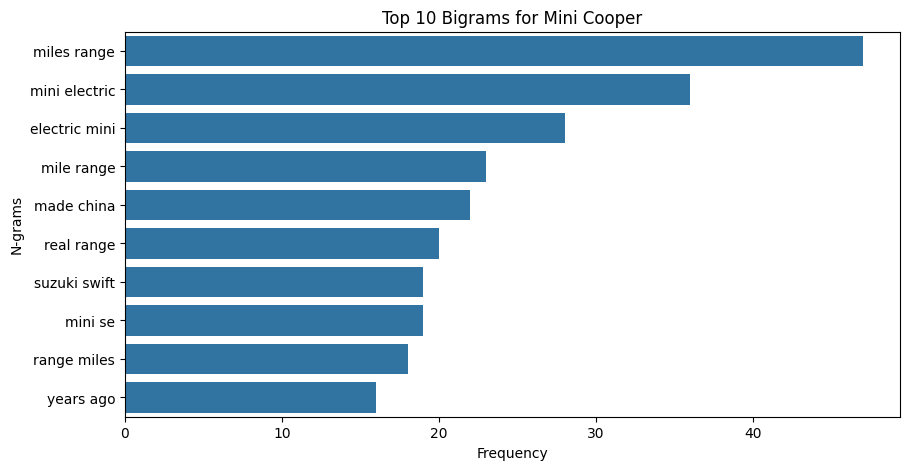

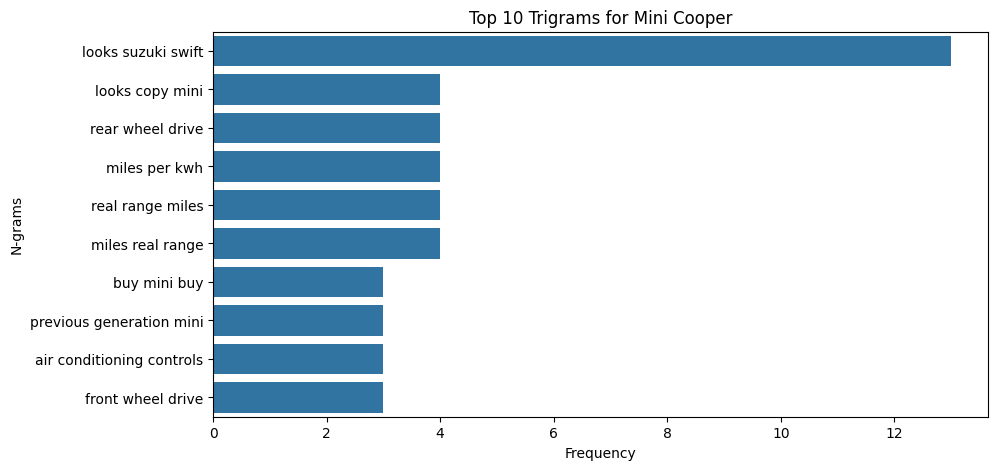

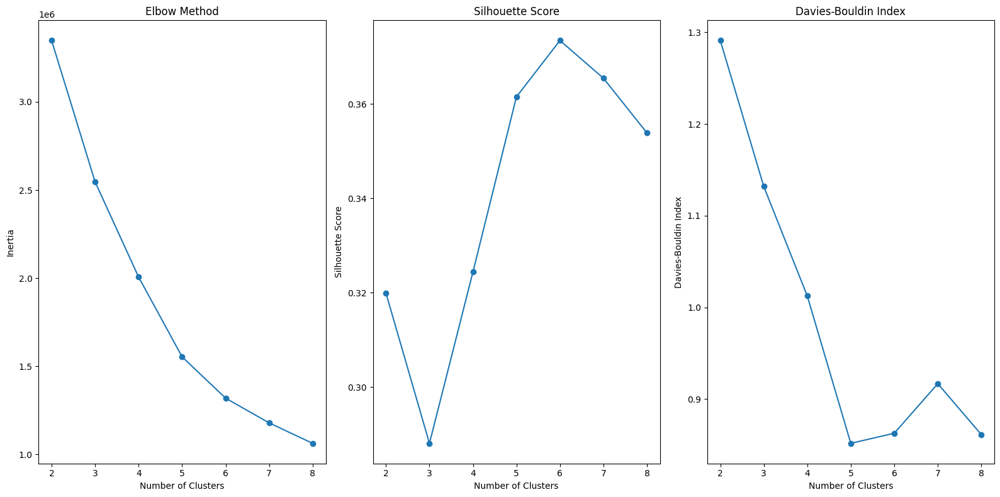

Optimal k values determined by different methods: {'Elbow': 5, 'Silhouette': 6, 'Davies-Bouldin': 5}
Selected optimal number of clusters for Mini Cooper: 5


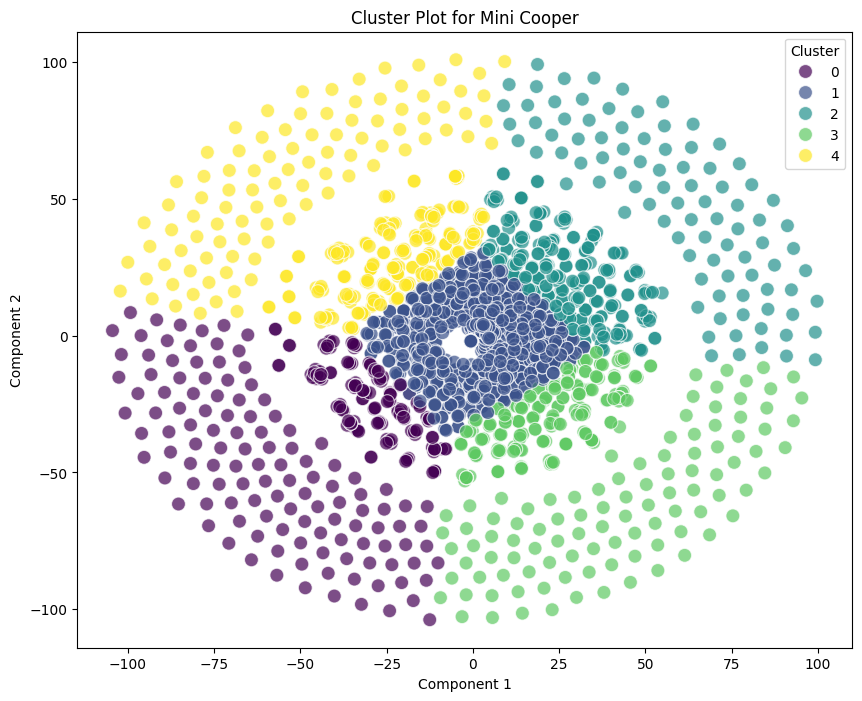

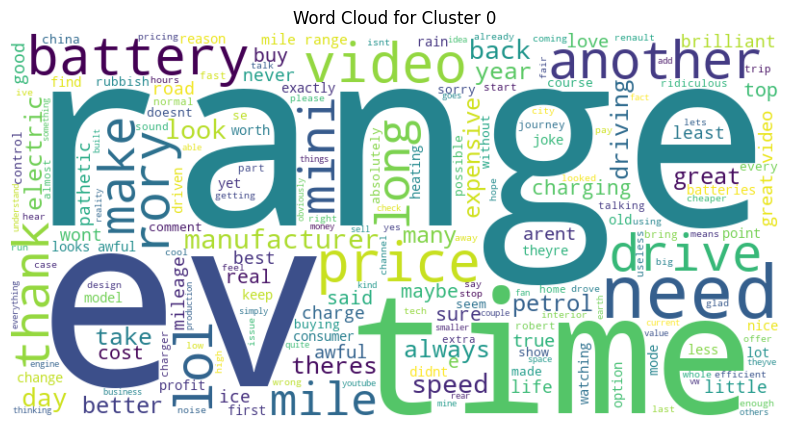

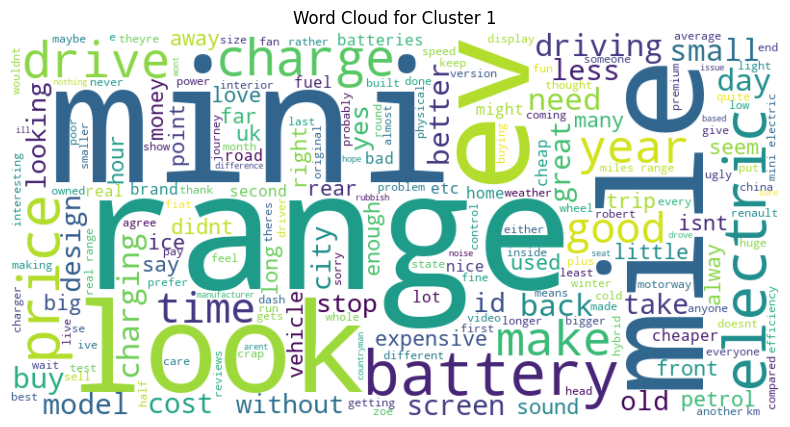

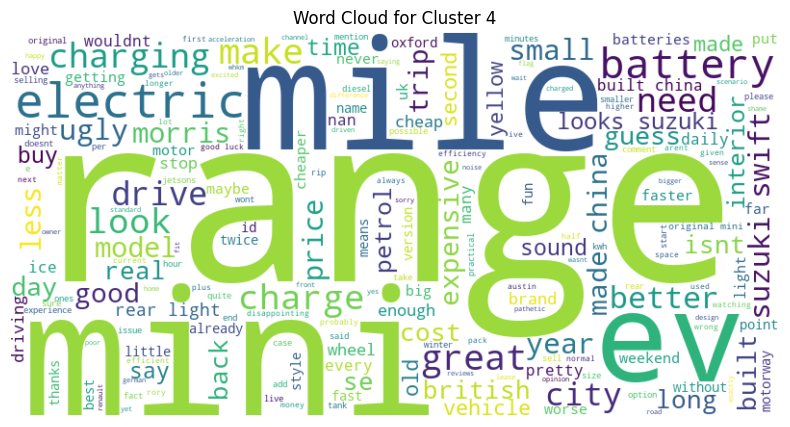

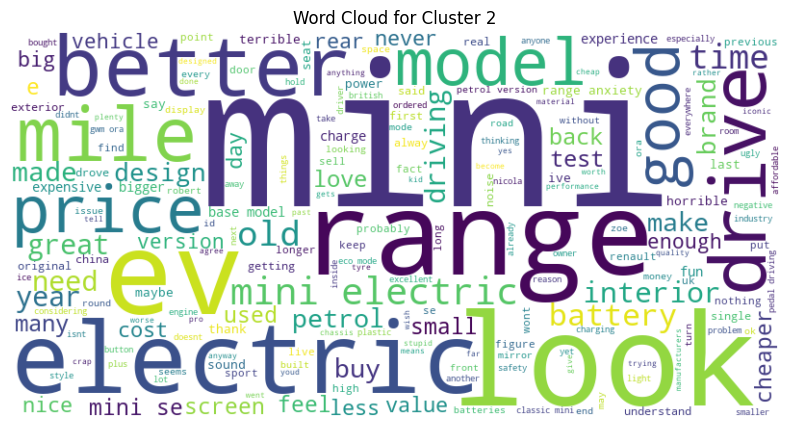

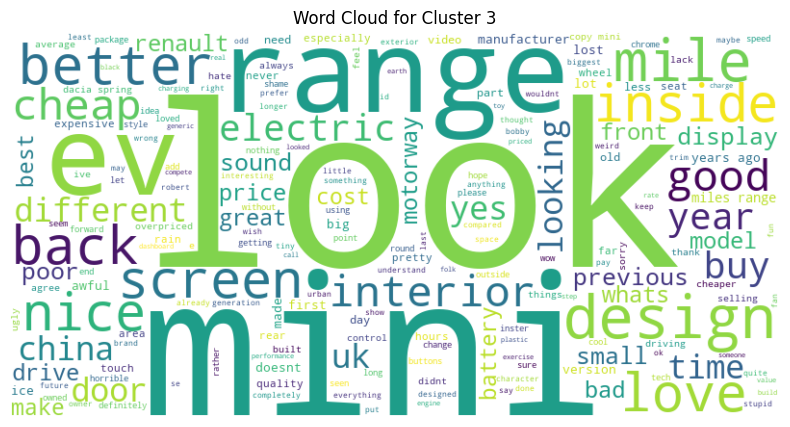

Car: Jeep Avenger
Top comments for each cluster and their sentiment scores:
Cluster 0:
 - where is the rails for bars 
 - go for petrol  youll be missing nothing in terms of car comparison apart from cable charging which is pretty much a headache when you are a busy person
 - good review good explanations but price is too high the touchscreen looks like someone bolted a tv to the dash funny windscreen decals dont sell the car
 - how is the car
 - msjranger no problems with it so far great little car range is around 220 summer 160170 winter motorway driving at 70mph youll get 170miles
 - kalelgreece no problems with it so far great little car range is around 220 summer 160170 winter motorway driving at 70mph youll get 170miles
 - gilestaylor8639 thank you
 - for a honest review watch matt watsons carwow review  oh wait you cant cause it was mysteriously taken down a mere few hours after it went live i saw it though it wasnt glowing 
tell me is this press review car doing the rounds the 

In [176]:
# Perform clustering and analysis for each car
results = {}
for car_name in car_names:
    print(f'Processing {car_name}...')
    try:
        clustered_data, top_comments, sentiment_scores, top_keywords, text_analysis = perform_clustering_and_analyze_text(competitors_data, car_name)
        results[car_name] = {
            'Clustered_Data': clustered_data,
            'Top_Comments': top_comments,
            'Sentiment_Scores': sentiment_scores,
            'Top_Keywords': top_keywords,
            'Text_Analysis': text_analysis
        }
    except ValueError as e:
        print(e)

# Access results
for car_name, result in results.items():
    print(f'Car: {car_name}')
    print('Top comments for each cluster and their sentiment scores:')
    for cluster, comments in result['Top_Comments'].items():
        print(f'Cluster {cluster}:')
        for comment in comments:
            print(f' - {comment}')
        print(f'Sentiment Score: {result["Sentiment_Scores"][cluster]}')
    print('Top Keywords for each cluster:')
    for cluster, keywords in result['Top_Keywords'].items():
        print(f'Cluster {cluster}: {keywords}')
    print('Text Analysis for each cluster:')
    for cluster, analysis in result['Text_Analysis'].items():
        print(f'Cluster {cluster}: {analysis}')

# Analysis of Sentiment Change from Pre-Launch to Post-Launch Period for Fiat 600e Competitors

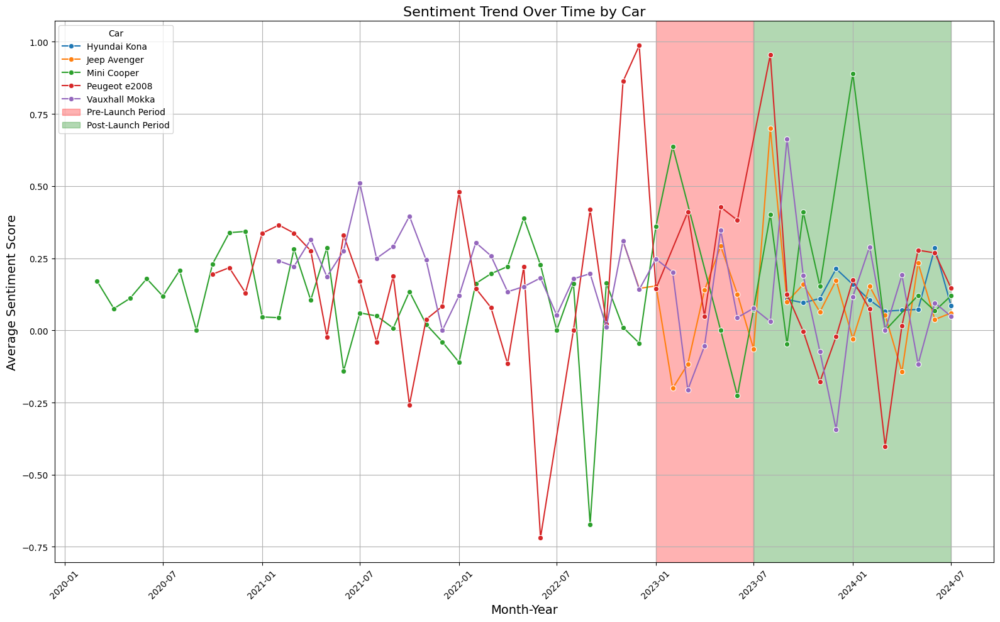

Sentiment Change from Pre-Launch to Post-Launch Period:
Car
Jeep Avenger      0.064425
Mini Cooper       0.042105
Peugeot e2008    -0.163205
Vauxhall Mokka   -0.005534
Hyundai Kona      0.124666
Name: Sentiment_Score, dtype: float64
Jeep Avenger: Sentiment improved by 0.06 after the launch of Fiat 600e.
Mini Cooper: Sentiment improved by 0.04 after the launch of Fiat 600e.
Peugeot e2008: Sentiment declined by -0.16 after the launch of Fiat 600e.
Vauxhall Mokka: Sentiment declined by -0.01 after the launch of Fiat 600e.
Hyundai Kona: Sentiment improved by 0.12 after the launch of Fiat 600e.


In [177]:

# Initialize Sentiment Analyzer
sia = SentimentIntensityAnalyzer()

# Convert 'Date' to datetime, invalid parsing will be set as NaT (Not a Time)
competitors_data['Date'] = pd.to_datetime(competitors_data['Date'], errors='coerce')

# Drop rows where 'Date' could not be parsed into a valid datetime
competitors_data = competitors_data.dropna(subset=['Date'])

# Function to compute sentiment scores
def compute_sentiment(text):
    return sia.polarity_scores(text)['compound']

# Apply sentiment analysis to the dataset
competitors_data['Sentiment_Score'] = competitors_data['Text'].apply(compute_sentiment)

# Group by 'Car' and Month-Year to compute the average sentiment over time
competitors_data['Month-Year'] = competitors_data['Date'].dt.to_period('M')

# Calculate the mean sentiment score for each car by month-year
monthly_sentiment = competitors_data.groupby(['Car', 'Month-Year'])['Sentiment_Score'].mean().reset_index()

# Convert Month-Year back to datetime for better plotting
monthly_sentiment['Month-Year_Start'] = monthly_sentiment['Month-Year'].dt.start_time

# Plotting the sentiment trend over month-year for each competitor
plt.figure(figsize=(16, 10))
sns.lineplot(data=monthly_sentiment, x='Month-Year_Start', y='Sentiment_Score', hue='Car', marker='o')

# Title and labels
plt.title('Sentiment Trend Over Time by Car', fontsize=16)
plt.xlabel('Month-Year', fontsize=14)
plt.ylabel('Average Sentiment Score', fontsize=14)

# Define the launch date of Fiat 600e
launch_date = pd.to_datetime('2023-07-01')

# Mark the pre-launch and post-launch periods
pre_launch_start = launch_date - pd.DateOffset(months=6)
post_launch_end = launch_date + pd.DateOffset(months=12)

plt.axvspan(pre_launch_start, launch_date, color='red', alpha=0.3, label='Pre-Launch Period')
plt.axvspan(launch_date, post_launch_end, color='green', alpha=0.3, label='Post-Launch Period')

plt.xticks(rotation=45)
plt.grid(True)
plt.legend(title='Car')
plt.tight_layout()
plt.show()

# Calculate the sentiment difference between pre-launch and post-launch periods
pre_launch_sentiment = monthly_sentiment[(monthly_sentiment['Month-Year_Start'] >= pre_launch_start) & 
                                         (monthly_sentiment['Month-Year_Start'] < launch_date)].groupby('Car')['Sentiment_Score'].mean()

post_launch_sentiment = monthly_sentiment[(monthly_sentiment['Month-Year_Start'] > launch_date) & 
                                          (monthly_sentiment['Month-Year_Start'] <= post_launch_end)].groupby('Car')['Sentiment_Score'].mean()

# Handle cases where data is missing in either pre-launch or post-launch
# For Hyundai Kona, calculate only the post-launch sentiment if pre-launch data is missing
if 'Hyundai Kona' not in pre_launch_sentiment.index:
    hyundai_sentiment_change = post_launch_sentiment.get('Hyundai Kona', None)
else:
    hyundai_sentiment_change = post_launch_sentiment.get('Hyundai Kona', 0) - pre_launch_sentiment.get('Hyundai Kona', 0)

# Filter out any cars that do not have data in both periods
valid_cars = pre_launch_sentiment.dropna().index.intersection(post_launch_sentiment.dropna().index)

# Calculate sentiment differences only for valid cars
sentiment_difference = post_launch_sentiment[valid_cars] - pre_launch_sentiment[valid_cars]

# Add Hyundai Kona sentiment change if it is available
if hyundai_sentiment_change is not None:
    sentiment_difference['Hyundai Kona'] = hyundai_sentiment_change

# Output the sentiment difference analysis
print("Sentiment Change from Pre-Launch to Post-Launch Period:")
print(sentiment_difference)

# Analyze the effect of the Fiat 600e launch
for car, diff in sentiment_difference.items():
    if diff > 0:
        print(f"{car}: Sentiment improved by {diff:.2f} after the launch of Fiat 600e.")
    else:
        print(f"{car}: Sentiment declined by {diff:.2f} after the launch of Fiat 600e.")